In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dataset/README.dataset.txt
/kaggle/input/dataset/README.roboflow.txt
/kaggle/input/dataset/data.yaml
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-230_jpg.rf.ed154fb5f9fd4ff231fc22d30b9880cd.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-287_jpg.rf.1ed6b9f94190ef050988eda55a94f7a6.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-301_jpg.rf.fcf268cd30fac5a2022260c558f054d7.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-62_jpg.rf.7dd2e6ad36a08a8578f20c9bf27ab532.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-431_jpg.rf.291ee4f8356972b6b66d417431d9b463.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-264_jpg.rf.9d63f2faf6935d3680927637f3b20936.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-467_jpg.rf.9e71fb6592b26a717b9c7af6c64240bb.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-132_jpg.rf.e19e76d873034197d6a50814f0f574b1.txt
/kaggle/input/dataset/valid/labels/GOPR0492_MP4-85_jpg.rf.92ab8b9b9e8a38b10faac128d8cf5c8b.txt
/kaggle/input/dataset/v

In [2]:
!pip install ultralytics

import numpy as np
import pandas as pd
import os
from pathlib import Path
import matplotlib.pyplot as plt
import cv2
import random
import glob
import yaml
import ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 687.9 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.3/721.3 kB 1.6 MB/s eta 0:00:00a 0:00:01


In [3]:
dataset_root = '/kaggle/input/dataset'

# Class names (make sure they match your label files)
class_map = {0: 'awake', 1:'Drowsy'}
classes = ['awake','Drowsy']

In [4]:
def count_objects_per_class(dataset_folder):
    """Counts objects of each class in a specific dataset folder."""
    label_folder = glob.glob(os.path.join(dataset_root, dataset_folder, 'labels', '*.txt'))
    cl = []
    for anno_file in label_folder:
        with open(anno_file) as f:
            lines = [line.strip() for line in open(anno_file, 'r')]
            cl.extend([line[0][0] for line in lines])
    cl_count = {c: cl.count(c) for c in cl}
    return cl_count

In [5]:
# Count objects in train, valid, and test sets
train_counts = count_objects_per_class('train')
valid_counts = count_objects_per_class('valid')
test_counts = count_objects_per_class('test')

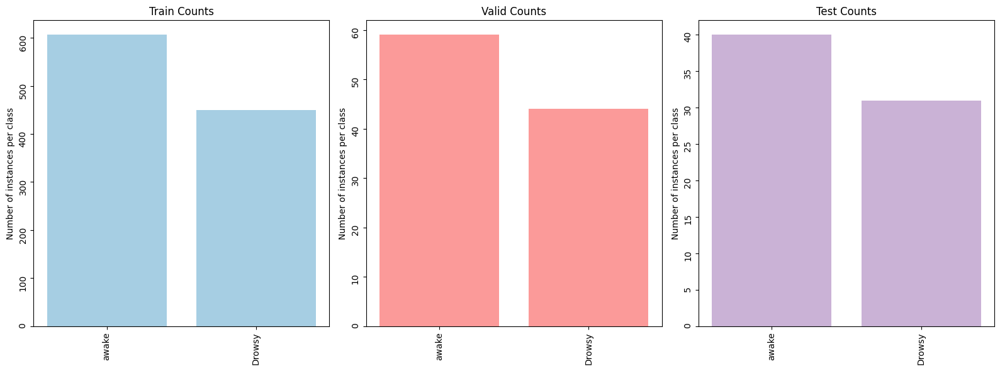

In [6]:
# Visualize object counts (modify as needed)
fig, axes = plt.subplots(1, 3, figsize=(16, 6))
labels = ['Train', 'Validation', 'Test']

colors = plt.cm.Paired(np.arange(len(labels)) / len(labels))

for i, (data_folder, counts) in enumerate(zip(['train', 'valid', 'test'], [train_counts, valid_counts, test_counts])):
    sorted_attribute_names = sorted(list(counts.keys()))
    sorted_measurments = [counts[c] for c in sorted_attribute_names]
    x = np.arange(len(sorted_attribute_names))

    axes[i].bar(x, sorted_measurments, tick_label=[class_map[int(item)] for item in sorted_attribute_names], color=colors[i])
    axes[i].tick_params(rotation=90)
    axes[i].set_title(f'{data_folder.capitalize()} Counts')
    axes[i].set_ylabel('Number of instances per class')

plt.tight_layout()
plt.show()

In [7]:
# Install pyyaml if not already done (make sure you have internet access)
!pip install pyyaml

In [8]:
# Import necessary modules
# wandb import removed as it's no longer needed

# Load YOLOv3 model
model = ultralytics.YOLO('yolov3.pt')  # Load pre-trained YOLOv3 weights

PRO TIP 💡 Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 198M/198M [00:00<00:00, 306MB/s]  


In [9]:
# Data configuration (compatible with YOLOv3 format)
yolo_yaml = {
    'path': dataset_root,
    'train': os.path.join(dataset_root, 'train'),  # Combine images and labels
    'val': os.path.join(dataset_root, 'valid'),
    'test': os.path.join(dataset_root, 'test'),

    # Classes
    'nc': 2,  # Number of classes
    'names': classes  # Use your defined class names
}

In [10]:
# Save data configuration
with open(os.path.join('/kaggle/working/', 'data.yaml'), 'w+') as file:
    yaml.dump(yolo_yaml, file)

In [11]:
# Train the model (adjust hyperparameters as needed)
  # Use keyword arguments
model.train(data='/kaggle/working/data.yaml', epochs=20, batch=16, imgsz=416)
# ... (rest of your analysis code, if any) ...

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov3.pt, data=/kaggle/working/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

100%|██████████| 755k/755k [00:00<00:00, 14.7MB/s]
2024-03-20 16:32:28,813	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-03-20 16:32:29,674	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-03-20 16:32:32.330507: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-20 16:32:32.330607: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-20 16:32:32.490802: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 1]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     37056  ultralytics.nn.modules.block.Bottleneck      [64, 64]                      
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    295680  ultralytics.nn.modules.block.Bottleneck      [128, 128]                    
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  8   4724736  ultralytics.nn.modules.block.Bottleneck      [256, 256]                    
  7                  -1  1   1180672  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.28.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 70.9MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/dataset/train/labels... 1056 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1056/1056 [00:03<00:00, 310.41it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/dataset/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/dataset/valid/labels... 103 images, 0 backgrounds, 0 corrupt: 100%|██████████| 103/103 [00:00<00:00, 306.46it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/dataset/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 84 weight(decay=0.0), 91 weight(decay=0.0005), 90 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      8.24G      1.141      1.681      1.529         29        416: 100%|██████████| 66/66 [00:35<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.48it/s]

                   all        103        103          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      8.72G     0.9696      1.143      1.417         34        416: 100%|██████████| 66/66 [00:33<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.76it/s]

                   all        103        103    0.00292     0.0169    0.00103   0.000567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      8.81G      1.022      1.024      1.454         28        416: 100%|██████████| 66/66 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.62it/s]

                   all        103        103      0.677      0.776      0.739      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      8.76G     0.9412      0.955      1.376         21        416: 100%|██████████| 66/66 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.69it/s]

                   all        103        103      0.858       0.75      0.882      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      8.77G     0.9537     0.9128        1.4         34        416: 100%|██████████| 66/66 [00:35<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.67it/s]

                   all        103        103      0.841      0.779      0.874      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      8.77G     0.8794     0.8242      1.335         33        416: 100%|██████████| 66/66 [00:34<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.73it/s]

                   all        103        103      0.888      0.889      0.949       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      8.88G     0.8462     0.8225      1.306         31        416: 100%|██████████| 66/66 [00:35<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]

                   all        103        103       0.88       0.89       0.91      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      8.77G     0.8086     0.7542       1.27         33        416: 100%|██████████| 66/66 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.71it/s]

                   all        103        103      0.856      0.809      0.859      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      8.76G     0.7839     0.7114      1.264         26        416: 100%|██████████| 66/66 [00:35<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.73it/s]

                   all        103        103      0.894      0.861      0.896      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      8.89G     0.7681     0.6742      1.236         25        416: 100%|██████████| 66/66 [00:35<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.66it/s]

                   all        103        103      0.871      0.909      0.967      0.755


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      8.77G     0.6279     0.5084      1.241         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.71it/s]

                   all        103        103      0.943      0.941      0.963      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      8.78G     0.5821     0.5106      1.203         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.64it/s]

                   all        103        103      0.877      0.964      0.975      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20       8.8G      0.556     0.4789      1.158         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.71it/s]

                   all        103        103      0.939      0.918       0.95      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      8.78G     0.5563     0.4542      1.142         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]

                   all        103        103      0.853      0.918      0.959       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      8.94G     0.5434     0.3998       1.14         16        416: 100%|██████████| 66/66 [00:34<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]

                   all        103        103      0.923      0.952      0.974      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      8.95G     0.5102     0.3969      1.115         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.68it/s]

                   all        103        103      0.892      0.955      0.975      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      8.97G      0.495      0.366      1.099         16        416: 100%|██████████| 66/66 [00:34<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]

                   all        103        103      0.938      0.921      0.979       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      8.96G     0.4784     0.3441      1.072         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.68it/s]

                   all        103        103      0.945      0.943      0.969       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      8.95G      0.486     0.3444       1.07         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]

                   all        103        103      0.946      0.936      0.975      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      8.96G     0.4502     0.2932      1.043         16        416: 100%|██████████| 66/66 [00:35<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.70it/s]

                   all        103        103      0.947      0.935      0.975      0.839



20 epochs completed in 0.251 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 207.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 207.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


                   all        103        103      0.923      0.952      0.974      0.864
                 awake        103         59      0.871          1      0.982      0.877
                Drowsy        103         44      0.975      0.904      0.967       0.85
Speed: 0.1ms preprocess, 11.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆███▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
lr/pg1,▃▆███▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
lr/pg2,▃▆███▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
metrics/mAP50(B),▁▁▆▇▇██▇▇███████████
metrics/mAP50-95(B),▁▁▅▆▅▆▇▆▇▇▇▇████████
metrics/precision(B),▁▁▆▇▇██▇█▇█▇█▇██████
metrics/recall(B),▁▁▇▆▇▇▇▇▇███████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▆▇▆▆▅▅▅▄▄▃▂▂▂▂▂▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e9a2f2c25f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [12]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/real-test/drowsy person.jpg'

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs

image 1/1 /kaggle/input/real-test/drowsy person.jpg: 288x416 1 Drowsy, 106.3ms
Speed: 2.0ms preprocess, 106.3ms inference, 552.5ms postprocess per image at shape (1, 3, 288, 416)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


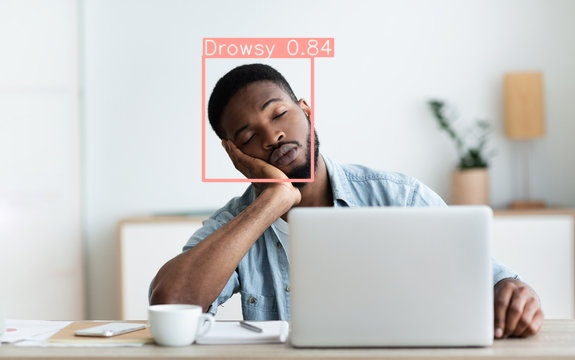

In [13]:
from IPython.display import Image

# Display the image with the detected objects
Image(filename='runs/detect/predict/drowsy person.jpg')

In [14]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/real-test/sleepppppyyyyy.jpg'

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs

image 1/1 /kaggle/input/real-test/sleepppppyyyyy.jpg: 288x416 1 Drowsy, 94.0ms
Speed: 1.2ms preprocess, 94.0ms inference, 509.3ms postprocess per image at shape (1, 3, 288, 416)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


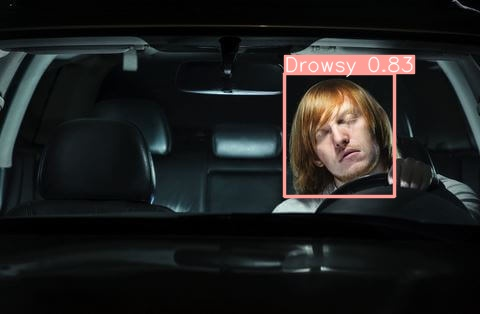

In [15]:
from IPython.display import Image

# Display the image with the detected objects
Image(filename='runs/detect/predict2/sleepppppyyyyy.jpg')

In [16]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/awake-people-dataset/awake girl.jpg'

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs

image 1/1 /kaggle/input/awake-people-dataset/awake girl.jpg: 416x320 1 awake, 86.7ms
Speed: 2.0ms preprocess, 86.7ms inference, 464.5ms postprocess per image at shape (1, 3, 416, 320)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


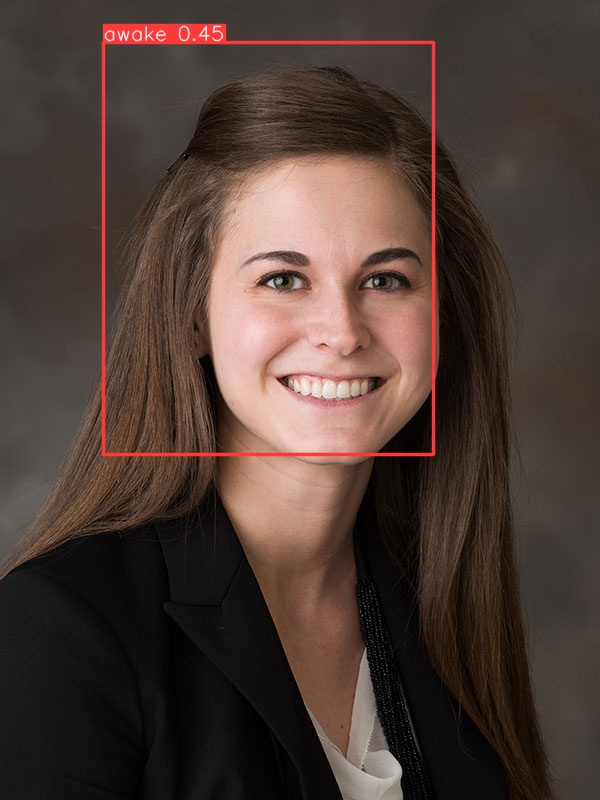

In [17]:
from IPython.display import Image

# Display the image with the detected objects
Image(filename='runs/detect/predict3/awake girl.jpg')

In [18]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/awake-people-dataset/awake guy.jpg'

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs

image 1/1 /kaggle/input/awake-people-dataset/awake guy.jpg: 416x416 2 awakes, 1 Drowsy, 54.9ms
Speed: 2.8ms preprocess, 54.9ms inference, 523.5ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


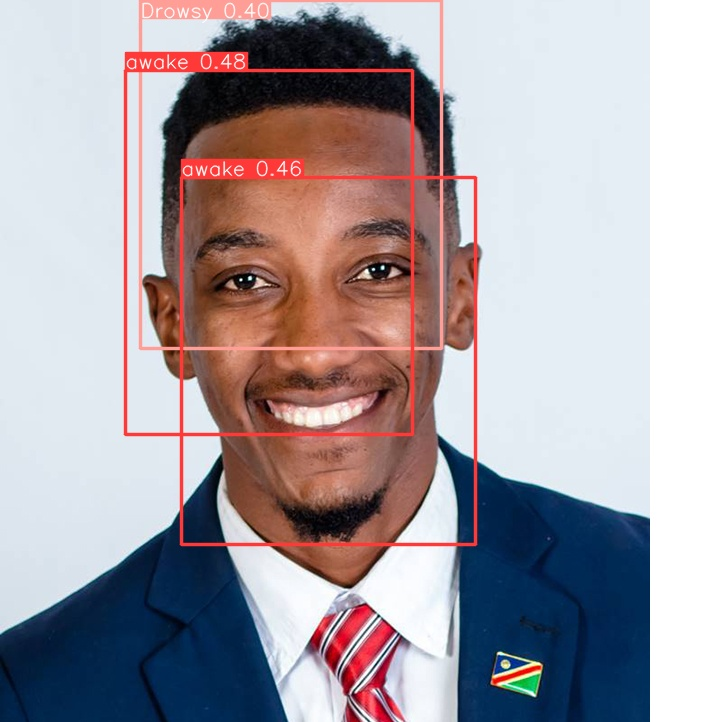

In [19]:
from IPython.display import Image

# Display the image with the detected objects
Image(filename='runs/detect/predict4/awake guy.jpg')

In [20]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/drowsy-ammu/IMG_20240320_224235.jpg'

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs

image 1/1 /kaggle/input/drowsy-ammu/IMG_20240320_224235.jpg: 416x320 1 awake, 1 Drowsy, 80.8ms
Speed: 2.5ms preprocess, 80.8ms inference, 549.5ms postprocess per image at shape (1, 3, 416, 320)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


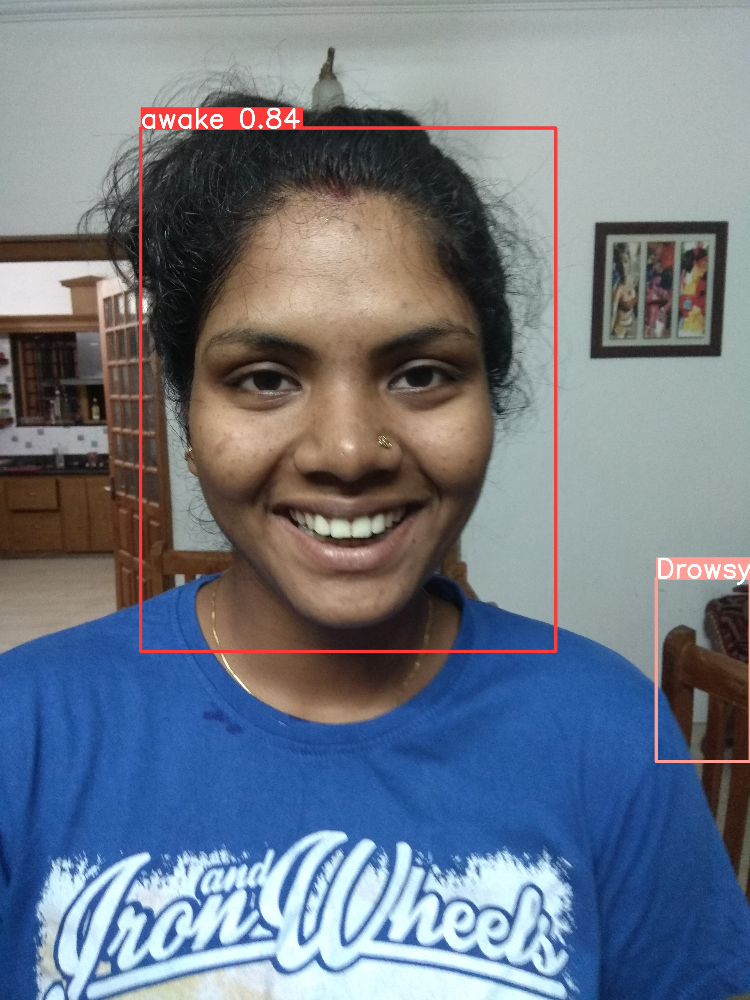

In [21]:
from IPython.display import Image

# Display the image with the detected objects
Image(filename='runs/detect/predict5/IMG_20240320_224235.jpg')

In [22]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/drowsy-ammu/IMG_20240320_224239.jpg'

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs

image 1/1 /kaggle/input/drowsy-ammu/IMG_20240320_224239.jpg: 416x320 1 awake, 84.2ms
Speed: 2.4ms preprocess, 84.2ms inference, 529.3ms postprocess per image at shape (1, 3, 416, 320)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


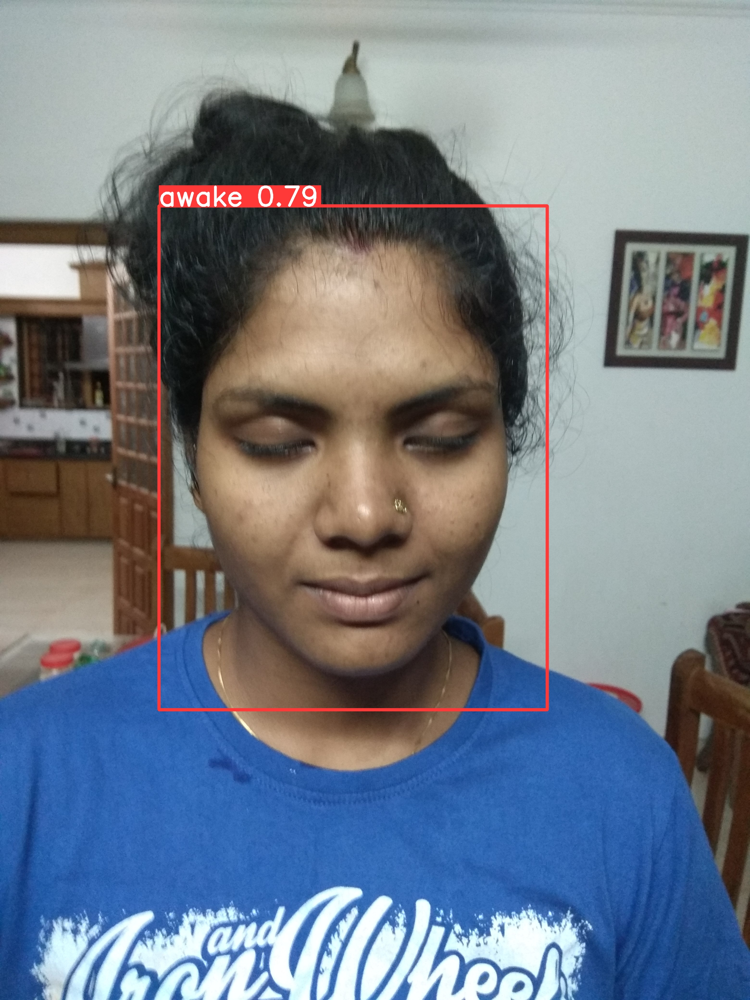

In [23]:
from IPython.display import Image

# Display the image with the detected objects
Image(filename='runs/detect/predict6/IMG_20240320_224239.jpg')

In [25]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/drowsy-ammu/IMG_20240320_224246.jpg'

Ultralytics YOLOv8.1.29 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv3 summary (fused): 226 layers, 103665782 parameters, 0 gradients, 282.2 GFLOPs

image 1/1 /kaggle/input/drowsy-ammu/IMG_20240320_224246.jpg: 416x320 1 Drowsy, 86.8ms
Speed: 2.9ms preprocess, 86.8ms inference, 658.9ms postprocess per image at shape (1, 3, 416, 320)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


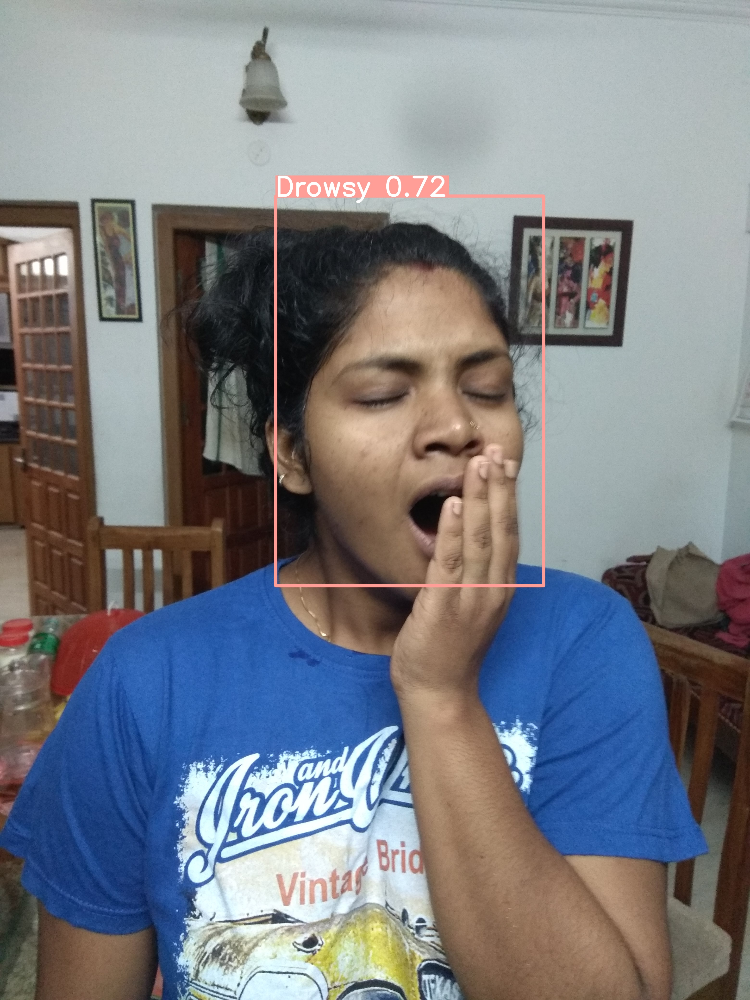

In [27]:
from IPython.display import Image

# Display the image with the detected objects
Image(filename='runs/detect/predict7/IMG_20240320_224246.jpg')